In [1]:
import openai
import string
openai.api_key = 'your API key'

In [2]:
import random
random.seed(15)
agents = {}
colors = ["blue", "green"]

for i in range(1, 17):
    agent_key = "agent_" + str(i)
    agent_color = random.choice(colors)
    agents[agent_key] = agent_color

print(agents)

{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}


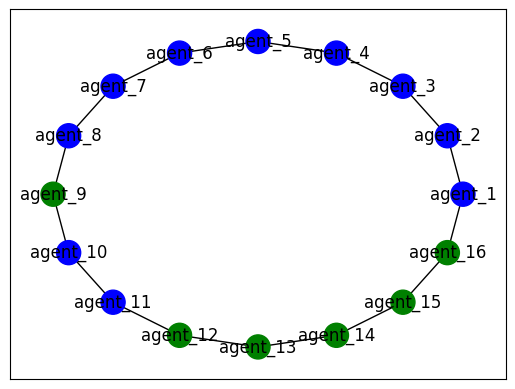

In [3]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Define the number of nodes
num_nodes = 16


# Add nodes and edges to the graph
G.add_nodes_from(agents.keys())
edges = [('agent_{}'.format(i), 'agent_{}'.format(i + 1)) for i in range(1, num_nodes)] + [('agent_{}'.format(num_nodes), 'agent_1')]
G.add_edges_from(edges)

# Specify the colors
default_color = 'red'

# Assign colors to the nodes based on the agents dictionary
node_colors = [agents.get(node, default_color) for node in G.nodes]

# Replace None with default_color in node_colors
node_colors = [default_color if color is None else color for color in node_colors]

# Draw the graph as a circular layout
pos = nx.circular_layout(G)
nx.draw_networkx(G, pos, node_color=node_colors, with_labels=True)

# Show the graph
plt.show()

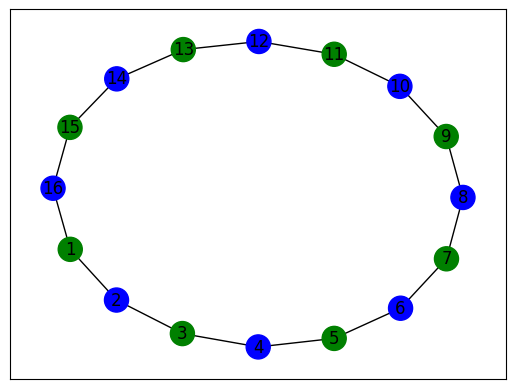

In [4]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Add nodes to the graph
num_nodes = 16
G.add_nodes_from(range(1, num_nodes + 1))

# Add edges to the graph
edges = [(i, i + 1) for i in range(1, num_nodes)] + [(num_nodes, 1)]
G.add_edges_from(edges)

# Specify the colors
colors = ['green', 'blue']

# Perform graph coloring
node_colors = nx.greedy_color(G, strategy='largest_first')

# Draw the graph
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, node_color=[colors[node_colors[node]] for node in G.nodes], with_labels=True)

# Show the graph
plt.show()

In [2]:
import requests
import json
import random
# Define the endpoint URL for the ChatGPT API
url = 'https://api.openai.com/v1/chat/completions'

# Set your OpenAI API key
api_key = 'your API key'

# Set the headers including the authorization with your API key
headers = {
    'Content-Type': 'application/json',
    'Authorization': f'Bearer {api_key}'
}

In [6]:
# Function to send a message to an agent and get the response
def send_message(message, agent_id):
    data = {
        'model': 'gpt-3.5-turbo',
        'messages': [
            {'role': 'system', 'content': 'You are a helpful assistant.'},
            {'role': 'user', 'content': message}
        ],
        'temperature':temperature
    }

    response = requests.post(url, headers=headers, json=data)

    if response.status_code == 200:
        result = response.json()
        answer = result['choices'][0]['message']['content']
#         print(f"Agent {agent_id}'s response: {answer}")
        return answer
    else:
        print(f"Request failed for Agent {agent_id} with status code: {response.status_code}")
        return None

In [7]:
# Define the initial message to Agent 1
def initial_massage_for_agent(num,agents):
    color_of_agent = agents[f'agent_{num}']
    if num == len(agents): 
        friend_on_the_right = agents[f'agent_{1}']
        friend_on_the_left = agents[f'agent_{num-1}']
    elif num == 1:
        friend_on_the_right = agents[f'agent_{num+1}']
        friend_on_the_left = agents[f'agent_{len(agents)}']
#     # Send the initial message to Agent 1
    else:
        friend_on_the_right = agents[f'agent_{num+1}']
        friend_on_the_left = agents[f'agent_{num-1}']
    return f" RESPOND ONLY WITH ONE WORD 'green' or 'blue': You are playing a color game. You are {color_of_agent}. Your friend on the right is {friend_on_the_right}, and your friend on the left is {friend_on_the_left}.Rules of the game: a. If your friend on the left and friend on the right have the same color, then you have to choose a different color than their color. For example, if firend from the right is 'blue' and firend from the left is 'blue' then you are green. Another example if your friend on the left is 'green' and on the right is 'green' then you choose 'blue'.b. If your friends have different colors (one is blue and the other is green), you must choose either 'blue' or 'green' randomly.c. If your friend on the left or on the right is not present (None), or if you are 'None', and your friends have the same color then choose a different color than their color (either 'blue' or 'green').d. You must respond with only one word, either 'green' or 'blue' in lowercase, even if you can't decide.I will keep these rules in mind . Respond only with the words 'green' or 'blue' in lowercase! YOU HAVE TO CHOOSE! If you can't decide, you must respond with only one word - green or blue! RESPOND ONLY ONE WORD!!!!"

In [8]:
def process_agents(agents):
    valid_colors = ['green', 'blue']
    processed_agents = {}

    for agent, color in agents.items():
        if color is not None:
            color = color.lower().translate(str.maketrans("", "", string.punctuation))
            color = color.strip()
            if color.lower() in valid_colors:
                processed_agents[agent] = color.lower()
            # Check if there is a long answer and extract 'green' or 'blue'
            elif len(color.split()) > 1:
                last_words = color.replace(',', ' ',).split()[-3:]
                for word in last_words:
                    word = word.strip('.').strip(',')
                    if word.lower() in valid_colors:
                        processed_agents[agent] = word.lower()
                        break
                else:
                    processed_agents[agent] = None
            else:
                processed_agents[agent] = None
        else:
                processed_agents[agent] = None
    return processed_agents

In [9]:
def check_neighbor_colors(agents):
    for num in range(1, len(agents)+1):
        color_of_agent = agents[f'agent_{num}']  
        if color_of_agent is None:
            return False      
        if num == len(agents): 
            friend_on_the_right = agents[f'agent_{1}']
            friend_on_the_left = agents[f'agent_{num-1}']
            if friend_on_the_left is None or friend_on_the_right is None:
                  return False
            if color_of_agent == friend_on_the_right or color_of_agent == friend_on_the_left:
                return False
        elif num == 1:
            friend_on_the_right = agents[f'agent_{num+1}']
            friend_on_the_left = agents[f'agent_{len(agents)}']
            if friend_on_the_left is None or friend_on_the_right is None:
                return False
            if color_of_agent == friend_on_the_right or color_of_agent == friend_on_the_left:
                return False
        else:
            friend_on_the_right = agents[f'agent_{num-1}']
            friend_on_the_left = agents[f'agent_{num+1}']
            if friend_on_the_left is None or friend_on_the_right is None:
                  return False
            if color_of_agent == friend_on_the_right or color_of_agent == friend_on_the_left:
                return False
    return True 

In [10]:
import time
import copy
agent_colors_list = []
agent_colors_list.append(agents)
count = 0; 
answer = False
# Start measuring the execution time
start_time = time.time()
while answer != True:
    for agent_id in range(1, len(agents)+1):
            temperature = random.uniform(1.5, 2)
            initial_message = initial_massage_for_agent(agent_id, agents)
            agent_response = send_message(initial_message, agent_id)
            agents[f'agent_{agent_id}'] = agent_response
            print(agent_id)
    print("ok")
    agents = process_agents(agents)
    print(agents)
    agent_colors_list.append(copy.deepcopy(agents)) 
    print(agent_colors_list)
    answer = check_neighbor_colors(agents) 
    count+=1;
    if count == 320 or answer == True:
        print("Too long")
        break;
execution_time = time.time() - start_time
print(f"Execution time: {execution_time} seconds")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': None, 'agent_12': None, 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': None, 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
Request failed for Agent 9 with status code: 503
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': None, 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
Request failed for Agent 4 with status code: 400
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': None, 'agent_4': None, 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': None, 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': None, 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
Request failed for Agent 12 with status code: 503
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'green', 'agent_11': None, 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
Request failed for Agent 16 with status code: 503
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
Request failed for Agent 15 with status code: 503
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': None, 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
Request failed for Agent 11 with status code: 503
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
Request failed for Agent 16 with status code: 400
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': None, 'agent_6': None, 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
Request failed for Agent 3 with status code: 502
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': None, 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': None, 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
Request failed for Agent 15 with status code: 502
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
Request failed for Agent 3 with status code: 502
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': None, 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'blue', 'agent_4': None, 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
Request failed for Agent 13 with status code: 502
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': None, 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
Request failed for Agent 11 with status code: 503
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': None, 'agent_10': 'green', 'agent_11': None, 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'ag

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': None, 'agent_4': None, 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': None, 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': None, 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
Request failed for Agent 6 with status code: 502
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': None, 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': None, 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': None, 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
Request failed for Agent 10 with status code: 502
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': 'green', 'agent_3': None, 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': None, 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': None, 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
Request failed for Agent 14 with status code: 503
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'age

1
Request failed for Agent 2 with status code: 400
2
3
4
5
6
7
8
9
10
11
12
13
14
15
Request failed for Agent 16 with status code: 400
16
ok
{'agent_1': None, 'agent_2': None, 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agen

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
Request failed for Agent 11 with status code: 503
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': None, 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': None, 'agent_15': 'blue', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'green', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
Request failed for Agent 16 with status code: 503
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
Request failed for Agent 3 with status code: 400
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': None, 'agent_4': None, 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': None, 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': None, 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': None, 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'ag

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': None, 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': None, 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': None, 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': None, 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': None, 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
Request failed for Agent 13 with status code: 502
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agen

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
11
Request failed for Agent 12 with status code: 400
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': None, 'agent_12': None, 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'bl

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
Request failed for Agent 10 with status code: 502
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
Request failed for Agent 15 with status code: 400
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': None, 'agent_15': None, 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
Request failed for Agent 11 with status code: 502
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': None, 'agent_12': None, 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': '

1
2
3
4
5
Request failed for Agent 6 with status code: 503
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'b

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': None, 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': None, 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': None, 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': None, 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': None, 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': None, 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': None, 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': None, 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'blue', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
Request failed for Agent 10 with status code: 503
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': None, 'agent_5': None, 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
Request failed for Agent 13 with status code: 502
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 

1
2
3
4
5
6
7
8
Request failed for Agent 9 with status code: 502
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
Request failed for Agent 8 with status code: 502
8
9
10
11
12
13
14
Request failed for Agent 15 with status code: 502
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': None, 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
Request failed for Agent 12 with status code: 502
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': None, 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': None, 'agent_7': None, 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'ag

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
Request failed for Agent 10 with status code: 503
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': None, 'agent_13': None, 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
Request failed for Agent 4 with status code: 400
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': None, 'agent_4': None, 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
Request failed for Agent 8 with status code: 502
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': None, 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': None, 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': None, 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': None, 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': None, 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': None, 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green',

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15':

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': None, 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
Request failed for Agent 3 with status code: 400
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': None, 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': None, 'agent_6': None, 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': None, 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'ag

1
2
3
4
5
6
Request failed for Agent 7 with status code: 502
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': None, 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': None, 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': None}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gre

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gree

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'green', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': None, 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'green', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green'

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'green', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'green', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'green', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'g

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': None, 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

Request failed for Agent 1 with status code: 503
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': None, 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'green', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'blue', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'gr

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'green', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': 'green', 'agent_13': 'blue', 'agent_14': 'blue', 'agent_15': 'green', 'agent_16': 'green'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': '

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'blue', 'agent_4': 'blue', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'green', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'green', 'agent_11': 'green', 'agent_12': 'blue', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'blue', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
ok
{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}
[{'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'Blue', 'agent_6': 'Blue', 'agent_7': 'blue', 'agent_8': 'Blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': 'Where are the other participants?', 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 'agent_16': 'blue'}, {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'blue', 'agent_6': 'blue', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'green', 'agent_10': 'blue', 'agent_11': 'green', 'agent_12': None, 'agent_13': 'blue', 'agent_14': 'green', 'agent_15': 'green', 

In [11]:
 agent_colors_list

[{'agent_1': 'blue',
  'agent_2': 'blue',
  'agent_3': 'green',
  'agent_4': 'green',
  'agent_5': 'Blue',
  'agent_6': 'Blue',
  'agent_7': 'blue',
  'agent_8': 'Blue',
  'agent_9': 'green',
  'agent_10': 'blue',
  'agent_11': 'green',
  'agent_12': 'Where are the other participants?',
  'agent_13': 'blue',
  'agent_14': 'green',
  'agent_15': 'green',
  'agent_16': 'blue'},
 {'agent_1': 'blue',
  'agent_2': 'blue',
  'agent_3': 'green',
  'agent_4': 'green',
  'agent_5': 'blue',
  'agent_6': 'blue',
  'agent_7': 'blue',
  'agent_8': 'blue',
  'agent_9': 'green',
  'agent_10': 'blue',
  'agent_11': 'green',
  'agent_12': None,
  'agent_13': 'blue',
  'agent_14': 'green',
  'agent_15': 'green',
  'agent_16': 'blue'},
 {'agent_1': 'green',
  'agent_2': 'blue',
  'agent_3': 'blue',
  'agent_4': 'blue',
  'agent_5': 'blue',
  'agent_6': 'blue',
  'agent_7': 'blue',
  'agent_8': 'green',
  'agent_9': 'green',
  'agent_10': 'green',
  'agent_11': 'green',
  'agent_12': 'blue',
  'agent_13':

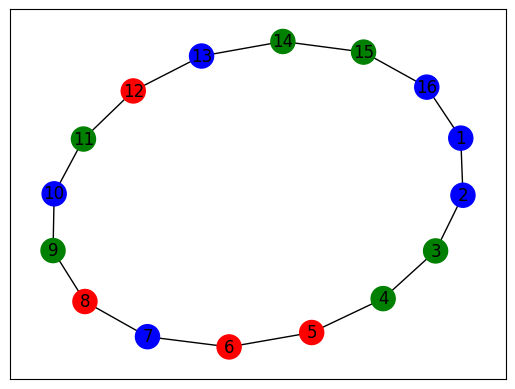

In [14]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

# Create a list of valid colors
valid_colors = {'blue', 'green', 'red', 'yellow', 'purple', 'orange', 'black', 'white', 'pink', 'grey'}

# Define the list of dictionaries
agent_dicts=agent_colors_list

# Create a graph
G = nx.Graph()

# Add nodes to the graph
num_nodes = 16
G.add_nodes_from(range(1, num_nodes + 1))

# Add edges to the graph
edges = [(i, i + 1) for i in range(1, num_nodes)] + [(num_nodes, 1)]
G.add_edges_from(edges)

# Perform graph coloring
pos = nx.spring_layout(G)

# Function to update the colors
def update(num):
    ax.clear()
    node_colors = []
    for node in G.nodes:
        color = agent_dicts[num].get(f'agent_{node}', 'grey')
        if color not in valid_colors:
            color = 'red'
        node_colors.append(color)
    nx.draw_networkx(G, pos, node_color=node_colors, with_labels=True)

fig, ax = plt.subplots()
ani = animation.FuncAnimation(fig, update, frames=len(agent_dicts), repeat=True)
writergif = animation.PillowWriter(fps=2)  
ani.save('filename_1.gif', writer=writergif)

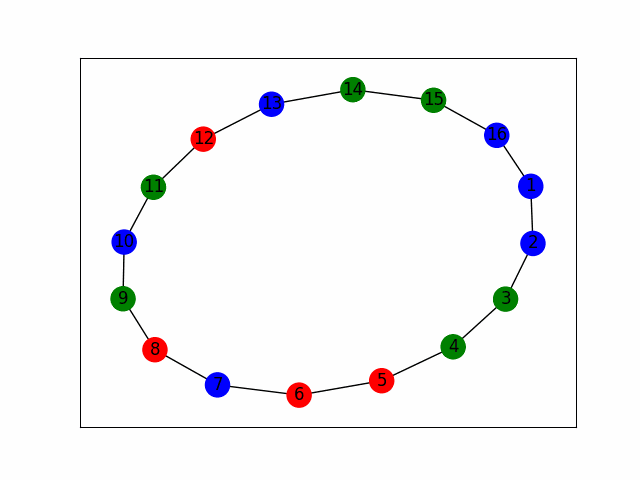

In [15]:
from IPython.display import Image

with open('filename_1.gif','rb') as file:
    display(Image(file.read()))

In [1]:
agents2 = {'agent_1': 'blue', 'agent_2': 'blue', 'agent_3': 'green', 'agent_4': 'green', 'agent_5': 'green', 'agent_6': 'green', 'agent_7': 'blue', 'agent_8': 'blue', 'agent_9': 'blue', 'agent_10': 'blue', 'agent_11': 'blue', 'agent_12': None, 'agent_13': 'blue', 'agent_14': None, 'agent_15': 'green', 'agent_16': 'blue'}

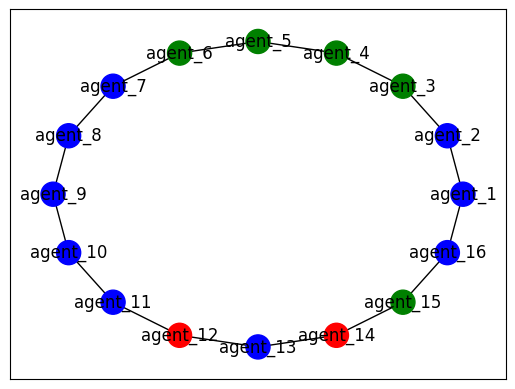

In [3]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Define the number of nodes
num_nodes = 16


# Add nodes and edges to the graph
G.add_nodes_from(agents2.keys())
edges = [('agent_{}'.format(i), 'agent_{}'.format(i + 1)) for i in range(1, num_nodes)] + [('agent_{}'.format(num_nodes), 'agent_1')]
G.add_edges_from(edges)

# Specify the colors
default_color = 'red'

# Assign colors to the nodes based on the agents dictionary
node_colors = [agents2.get(node, default_color) for node in G.nodes]

# Replace None with default_color in node_colors
node_colors = [default_color if color is None else color for color in node_colors]

# Draw the graph as a circular layout
pos = nx.circular_layout(G)
nx.draw_networkx(G, pos, node_color=node_colors, with_labels=True)

# Show the graph
plt.show()

In [16]:
# Define the initial message to Agent 1
def initial_massage_for_agent(num,agents):
    color_of_agent = agents[f'agent_{num}']
    if num == len(agents): 
        friend_on_the_right = agents[f'agent_{1}']
        friend_on_the_left = agents[f'agent_{num-1}']
    elif num == 1:
        friend_on_the_right = agents[f'agent_{num+1}']
        friend_on_the_left = agents[f'agent_{len(agents)}']
#     # Send the initial message to Agent 1
    else:
        friend_on_the_right = agents[f'agent_{num+1}']
        friend_on_the_left = agents[f'agent_{num-1}']
    return f" RESPOND ONLY WITH ONE WORD 'green' or 'blue': You are playing a color game. Scheme goes like this:   Left friend of your left friend {friend_of_the_right_friend} <- Friend on the left {friend_on_the_left} <- You {color_of_agent} -> Friend on the right {friend_on_the_right}-> Right friend of your right friend {friend_of_the_right_friend}. Rules of the game:  In general: Choose the color with the fewest local conflicts. Rules:If your friend on the left and friend on the right have the same color, then you must choose a different color than their color. Examples:1.blue(friend on the left) blue(you) Blue (friend on the right) according to this scheme you must choose green. 2.green(friend on the left) green(you) green (friend on the right) according to this scheme you must choose blue. 3.green(friend on the left) blue(you) green (friend on the right) according to this scheme you must choose blue. 4.blue(friend on the left) green(you) blue (friend on the right) according to this scheme you must choose green. 5.blue(friend on the left) green(you) green (friend on the right) according to this scheme you must choose randomly: blue or green. You must choose either 'blue' or 'green'. 6.green(friend on the left) green(you) blue (friend on the right) according to this scheme you must choose randomly: blue or green. You must choose either 'blue' or 'green'. 7.blue(friend on the left) blue(you) green (friend on the right) according to this scheme you must choose randomly: blue or green. You must choose either 'blue' or 'green'. 8.green(friend on the left) blue(you) blue (friend on the right) according to this scheme you must choose randomly: blue or green. You must choose either 'blue' or 'green'.9.green(friend on the left) blue(you) green (friend on the right) according to this scheme you must stay blue.10.None(friend on the left) blue(you) green (friend on the right) You must choose either 'blue' or 'green'11.green (friend on the left) blue(you)None (friend on the right) You must choose either 'blue' or 'green'12.None(friend on the left) green(you) green (friend on the right) according to this scheme you choose blue.13.None(friend on the left) blue(you) blue (friend on the right) according to this scheme you choose green.14.None(friend on the left) green(you) blue (friend on the right) You must choose either 'blue' or 'green'15.blue(friend on the left) green(you)None (friend on the right) You must choose either 'blue' or 'green'16.Blue (friend on the left) gree(you) blue (friend on the right) according to this scheme you must stay blue.17.You also need to think about other friends - Choose the color with the fewest local conflict or/and Defer to high-degree neighbors18.If your friend on the left or on the right with no color (None), or if you are 'None', and your friends have the same color then choose a different color than their color (either 'blue' or 'green').19.VERY IMPORTANT! THAT IS A RESTRICTION OF THE GAME! You must respond with only one word, either 'green' or 'blue' in lowercase, even if you can't decide. YOU HAVE TO CHOOSE! If you can't decide, you must respond with only one word - green or blue! RESPOND ONLY ONE WORD!!!!which color would you choose to fill ?Provide short answers according to the following  JSON schema: Output JSON Schema: {'color'}.For example,a valid answer could be : {'green'}  or {'blue'}"


In [ ]:
import time
import copy
agent_colors_list = []
agent_colors_list.append(agents)
count = 0; 
answer = False
# Start measuring the execution time
start_time = time.time()
while answer != True:
    for agent_id in range(1, len(agents)+1):
            temperature = random.uniform(1.5, 2)
            initial_message = initial_massage_for_agent(agent_id, agents)
            agent_response = send_message(initial_message, agent_id)
            agents[f'agent_{agent_id}'] = agent_response
            print(agent_id)
    print("ok")
    agents = process_agents(agents)
    print(agents)
    agent_colors_list.append(copy.deepcopy(agents)) 
    print(agent_colors_list)
    answer = check_neighbor_colors(agents) 
    count+=1;
    if count == 320 or answer == True:
        print("Too long")
        break;
execution_time = time.time() - start_time
print(f"Execution time: {execution_time} seconds")

1
2
3
4
5
6
